# <center>Predicting The Player's Market Value And Classification According To Play Zones : FIFA19</center>

FIFA 19 is a football simulation video game developed by EA Vancouver as part of Electronic Arts' FIFA series. Announced on 6 June 2018 for its E3 2018 press conference, it was released on 28 September 2018 for PlayStation 3, PlayStation 4, Xbox 360, Xbox One, Nintendo Switch, and Microsoft Windows.It is the 26th installment in the FIFA series. As with FIFA 18, Cristiano Ronaldo initially as the cover athlete of the regular edition: however, following his unanticipated transfer from Spanish club Real Madrid to Italian side Juventus, new cover art was released, featuring Neymar, Kevin De Bruyne and Paulo Dybala.

The game features the UEFA club competitions for the first time, including the UEFA Champions League and UEFA Europa League.Martin Tyler and Alan Smith return as regular commentators, while the new commentary team of Derek Rae and Lee Dixon feature in the UEFA competitions mode.Composer Hans Zimmer and rapper Vince Staples recorded a new remix of the UEFA Champions League anthem specifically for the game. The character Alex Hunter, who first appeared in FIFA 17 returns for the third and final installment of "The Journey", entitled, "The Journey: Champions".In June 2019, a free update added the FIFA Women's World Cup as a separate game mode.

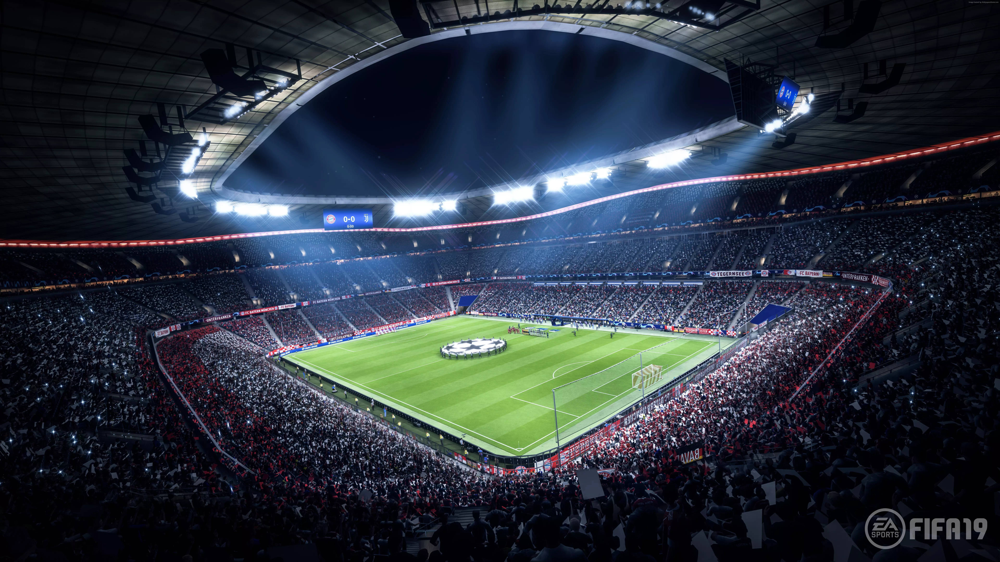

## Loading Libraries

In [1]:
import pandas as pd
import numpy as np
!pip install folium
import folium
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, validation_curve, cross_val_score, cross_val_predict
from sklearn import metrics, feature_selection
print('Libraries imported')
%matplotlib inline

     |████████████████████████████████| 102kB 6.8MB/s ta 0:00:011
Libraries imported


## Loading Data

In [2]:
#loading data through IBM Credential
import types
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_c98fc7dc180e4b6eb37009e4ea41fd4f = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='-OI95S6y48TGYAbpOI9bp6dFrO93RvrNarhgWfGAo49r',
    ibm_auth_endpoint="https://iam.eu-gb.bluemix.net/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3.eu-geo.objectstorage.service.networklayer.com')

body = client_c98fc7dc180e4b6eb37009e4ea41fd4f.get_object(Bucket='courseraproject-donotdelete-pr-k8bio64bnvsexv',Key='fifa19.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

In [3]:
fifa_df = pd.read_csv(body)
fifa_df.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [4]:
#Dropping unnecessary columns and saving club logo, photo, flag, Jersey Number in picture_df
player = fifa_df[['Name','Photo','Flag','Club Logo','Jersey Number','Nationality','Overall','Potential','Club']]
df = fifa_df.drop(['Unnamed: 0','ID','Real Face','Joined','Loaned From','Contract Valid Until',
                   'Photo','Flag','Club Logo','Jersey Number','Release Clause','Special'],axis=1)
df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,Left,5.0,...,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,Right,5.0,...,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,Right,5.0,...,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,Right,4.0,...,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,Right,4.0,...,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0


## Data Cleaning

### Description of data

In [5]:
df.shape

(18207, 77)

In [6]:
df.columns

Index(['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
       'Wage', 'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Position', 'Height', 'Weight',
       'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM',
       'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB',
       'LCB', 'CB', 'RCB', 'RB', 'Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility',
       'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength',
       'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle',
       'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 77 columns):
Name                        18207 non-null object
Age                         18207 non-null int64
Nationality                 18207 non-null object
Overall                     18207 non-null int64
Potential                   18207 non-null int64
Club                        17966 non-null object
Value                       18207 non-null object
Wage                        18207 non-null object
Preferred Foot              18159 non-null object
International Reputation    18159 non-null float64
Weak Foot                   18159 non-null float64
Skill Moves                 18159 non-null float64
Work Rate                   18159 non-null object
Body Type                   18159 non-null object
Position                    18147 non-null object
Height                      18159 non-null object
Weight                      18159 non-null object
LS                          16122 non-nul

In [8]:
df.describe()

,Age,Overall,Potential,International Reputation,Weak Foot,Skill Moves,Crossing,Finishing,HeadingAccuracy,ShortPassing,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,...,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,25.122206,66.238699,71.307299,1.113222,2.947299,2.361308,49.734181,45.550911,52.298144,58.686712,...,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,4.669943,6.908930,6.136496,0.394031,0.660456,0.756164,18.364524,19.525820,17.379909,14.699495,...,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,16.000000,46.000000,48.000000,1.000000,1.000000,1.000000,5.000000,2.000000,4.000000,7.000000,...,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,21.000000,62.000000,67.000000,1.000000,3.000000,2.000000,38.000000,30.000000,44.000000,54.000000,...,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,66.000000,71.000000,1.000000,3.000000,2.000000,54.000000,49.000000,56.000000,62.000000,...,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,28.000000,71.000000,75.000000,1.000000,3.000000,3.000000,64.000000,62.000000,64.000000,68.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,45.000000,94.000000,95.000000,5.000000,5.000000,5.000000,93.000000,95.000000,94.000000,93.000000,...,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000


### Handling Missing Data

In [9]:
#columns having float values
numeric_col = ['Crossing','Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
               'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
               'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
               'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
               'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
               'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
               'GKKicking', 'GKPositioning', 'GKReflexes']
#columns having integer value
int_col = ['International Reputation', 'Weak Foot', 'Skill Moves']
#columns having string value
string_col = ['Work Rate', 'Body Type', 'Position', 'Preferred Foot',
              'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
              'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
              'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB']

In [10]:
#Filling missing value with mean
imputef = SimpleImputer(strategy='mean')
df[numeric_col] = imputef.fit_transform(df[numeric_col])

In [11]:
#Filling missing value with median
imputei = SimpleImputer(strategy='median')
df[int_col] = imputei.fit_transform(df[int_col]).astype(int)

In [12]:
#Filling missing value with most_frequent
imputes = SimpleImputer(strategy='most_frequent')
df[string_col] = imputes.fit_transform(df[string_col])

In [13]:
#Filling specific value
df['Club'].fillna('No club',inplace=True)
df['Body Type'].replace(to_replace='PLAYER_BODY_TYPE_25',value='Salah',inplace=True)
player['Jersey Number'].fillna(8,inplace=True)
player['Club'].fillna('No Club',inplace=True)

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/generic.py:6130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


### Converting relevant features to numeric

In [14]:
#Functions to convert Weight, Height, Wage, Value to numeric data
def stringtoweight(value):
    out = value.replace('lbs','')
    return float(out)
def stringtoheight(value):
    out = (float(value[0])*12) + (float(value[2:]))
    return float(out)
def stringtomoney(value):
    out = value.replace('€','')
    if 'M' in out:
        out = float(out.replace('M',''))*1000000
    elif 'K' in value:
        out = float(out.replace('K',''))*1000
    return float(out)

In [15]:
df['Weight'] = df['Weight'].apply(lambda x : stringtoweight(x))
df['Weight'].head()

0    159.0
1    183.0
2    150.0
3    168.0
4    154.0
Name: Weight, dtype: float64

In [16]:
df['Height'] = df['Height'].apply(lambda x : stringtoheight(x))
df['Height'].head()

0    67.0
1    74.0
2    69.0
3    76.0
4    71.0
Name: Height, dtype: float64

In [17]:
df['Value'] = df['Value'].apply(lambda x : stringtomoney(x))
df['Value'].head()

0    110500000.0
1     77000000.0
2    118500000.0
3     72000000.0
4    102000000.0
Name: Value, dtype: float64

In [18]:
df['Wage'] = df['Wage'].apply(lambda x : stringtomoney(x))
df['Wage'].head()

0    565000.0
1    405000.0
2    290000.0
3    260000.0
4    355000.0
Name: Wage, dtype: float64

### Aggregating similiar features 

In [19]:
#features for aggregating
pace = ['Acceleration','SprintSpeed']
shooting = ['Positioning','Finishing','ShotPower','LongShots','Volleys','Penalties']
passing = ['Vision','Crossing','FKAccuracy','ShortPassing','LongPassing','Curve']
technique = ['Agility','Balance','Reactions','BallControl','Dribbling','Composure']
defense = ['Interceptions','Marking','HeadingAccuracy','StandingTackle','SlidingTackle']
physical = ['Jumping','Stamina','Strength','Aggression']
goalkeeper = ['GKDiving','GKHandling','GKKicking','GKPositioning','GKReflexes','Reactions']
rating = ['Potential','Overall']

In [20]:
df['Pace'] = df[pace].mean(axis=1).round(0).astype(int)
df['Shooting'] = df[shooting].mean(axis=1).round(0).astype(int)
df['Passing'] = df[passing].mean(axis=1).round(0).astype(int)
df['Technique'] = df[technique].mean(axis=1).round(0).astype(int)
df['Defense'] = df[defense].mean(axis=1).round(0).astype(int)
df['physical'] = df[physical].mean(axis=1).round(0).astype(int)
df['Goalkeeper'] = df[goalkeeper].mean(axis=1).round(0).astype(int)
df['Rating'] = df[rating].mean(axis=1).round(0).astype(int)
player['Rating'] = player[rating].mean(axis=1).round(0).astype(int)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [21]:
#Dropping the features aggregated
df = df.drop(['Crossing','Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
              'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
              'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'LS', 
              'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM',
              'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB',
              'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
              'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
              'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
              'GKKicking', 'GKPositioning', 'GKReflexes','Overall','Potential'],axis=1)
player = player.drop(['Overall','Potential'],axis=1)

## Exploratory Data Analysis

### Descriptive Analysis

In [22]:
#summary of dataframe after cleaning
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 23 columns):
Name                        18207 non-null object
Age                         18207 non-null int64
Nationality                 18207 non-null object
Club                        18207 non-null object
Value                       18207 non-null float64
Wage                        18207 non-null float64
Preferred Foot              18207 non-null object
International Reputation    18207 non-null int64
Weak Foot                   18207 non-null int64
Skill Moves                 18207 non-null int64
Work Rate                   18207 non-null object
Body Type                   18207 non-null object
Position                    18207 non-null object
Height                      18207 non-null float64
Weight                      18207 non-null float64
Pace                        18207 non-null int64
Shooting                    18207 non-null int64
Passing                     18207 non-null 

In [23]:
#statistical summary of dataframe
df.describe(include='all')

,Name,Age,Nationality,Club,Value,Wage,Preferred Foot,International Reputation,Weak Foot,Skill Moves,...,Height,Weight,Pace,Shooting,Passing,Technique,Defense,physical,Goalkeeper,Rating
count,18207,18207.000000,18207,18207,1.820700e+04,18207.000000,18207,18207.000000,18207.000000,18207.000000,...,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000
unique,17194,NaN,164,652,NaN,NaN,2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,J. Rodríguez,NaN,England,No club,NaN,NaN,Right,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,11,NaN,1662,241,NaN,NaN,13996,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,25.122206,NaN,NaN,2.410696e+06,9731.312133,NaN,1.112924,2.947438,2.360356,...,71.362937,165.976547,64.670731,48.254133,50.767891,60.279892,47.929368,62.371396,24.029714,68.773219
std,NaN,4.669943,NaN,NaN,5.594933e+06,21999.290406,NaN,0.393554,0.659591,0.755394,...,2.646371,15.572856,14.480663,16.929540,14.686353,11.618458,18.417353,10.851951,14.140502,5.951240
min,NaN,16.000000,NaN,NaN,0.000000e+00,0.000000,NaN,1.000000,1.000000,1.000000,...,61.000000,110.000000,12.000000,6.000000,12.000000,20.000000,8.000000,20.000000,9.000000,48.000000
25%,NaN,21.000000,NaN,NaN,3.000000e+05,1000.000000,NaN,1.000000,3.000000,2.000000,...,69.000000,154.000000,58.000000,37.000000,42.000000,55.000000,33.000000,56.000000,18.000000,65.000000
50%,NaN,25.000000,NaN,NaN,6.750000e+05,3000.000000,NaN,1.000000,3.000000,2.000000,...,71.000000,165.000000,67.000000,51.000000,53.000000,62.000000,52.000000,64.000000,20.000000,68.000000
75%,NaN,28.000000,NaN,NaN,2.000000e+06,9000.000000,NaN,1.000000,3.000000,3.000000,...,73.000000,176.000000,74.000000,61.000000,61.000000,68.000000,63.000000,70.000000,21.000000,72.000000


#### List of top 5 Indian players

In [24]:
indian = df[df['Nationality']=='India'].sort_values(by='Rating',ascending=False)['Name']
list(indian.head(10))

['S. Jhingan',
 'S. Chhetri',
 'G. Singh Sandhu',
 'A. Thapa',
 'P. Kotal',
 'U. Singh',
 'P. Halder',
 'J. Lalpekhlua',
 'H. Narzary',
 'A. Kuruniyan']

#### List of top goalkeepers

In [25]:
df
goal = df.sort_values(by='Goalkeeper',ascending=False)['Name']
list(goal.head(10))

['De Gea',
 'M. Neuer',
 'M. ter Stegen',
 'J. Oblak',
 'Ederson',
 'Alisson',
 'T. Courtois',
 'G. Buffon',
 'S. Handanovič',
 'K. Navas']

#### Top players having highest weak foot rating

In [26]:
list(df.sort_values(by='Weak Foot',ascending=False)['Name'].head(10))

['B. Ziegenbein',
 'F. Kainz',
 'Pozuelo',
 'K. Peterson',
 'K. Acosta',
 'K. Kratz',
 'P. Forsell',
 'L. Baker',
 'M. Topal',
 'N. Feil']

#### Top players having highest skill moves

In [27]:
list(df.sort_values(by='Skill Moves',ascending=False)['Name'].head(10))

['M. Ødegaard',
 'Nani',
 'Y. Bolasie',
 'Douglas Costa',
 'J. Sancho',
 'Quaresma',
 'Shikabala',
 'Gelson Martins',
 'Cristiano Ronaldo',
 'Marcelo']

#### Most popular clubs

In [28]:
club = df.groupby('Club')['Wage'].mean().sort_values(ascending=False)
list(club.index[:10])

['Real Madrid',
 'FC Barcelona',
 'Juventus',
 'Manchester City',
 'Manchester United',
 'Chelsea',
 'Liverpool',
 'Tottenham Hotspur',
 'FC Bayern München',
 'Arsenal']

#### Most paid players 

In [29]:
list(df.sort_values('Wage',ascending=False)['Name'].head(10))

['L. Messi',
 'L. Suárez',
 'L. Modrić',
 'Cristiano Ronaldo',
 'Sergio Ramos',
 'T. Kroos',
 'G. Bale',
 'K. De Bruyne',
 'E. Hazard',
 'Coutinho']

#### Most attacking clubs and attacking players

In [30]:
attack = df[['Club','Name','Shooting','Passing','Technique']]
attack = attack.groupby(['Club','Name']).mean()
attack = attack.apply(sum,axis=1).sort_values(ascending=False)[:10]
attack /= 3
list(attack.index)

[('FC Barcelona', 'L. Messi'),
 ('Paris Saint-Germain', 'Neymar Jr'),
 ('Chelsea', 'E. Hazard'),
 ('Juventus', 'Cristiano Ronaldo'),
 ('Manchester City', 'K. De Bruyne'),
 ('Juventus', 'P. Dybala'),
 ('FC Bayern München', 'J. Rodríguez'),
 ('Borussia Dortmund', 'M. Reus'),
 ('Real Madrid', 'L. Modrić'),
 ('FC Barcelona', 'Coutinho')]

#### Most defensive clubs and defenders

In [31]:
defence = df[['Club','Name','Defense','physical','Pace']]
defence = defence.groupby(['Club','Name']).mean()
defence = defence.apply(sum,axis=1).sort_values(ascending=False)[:10]
defence /= 3
list(defence.index)

[('Real Madrid', 'Sergio Ramos'),
 ('Manchester City', 'K. Walker'),
 ('Roma', 'K. Manolas'),
 ('FC Barcelona', 'Jordi Alba'),
 ('Juventus', 'Alex Sandro'),
 ('Chelsea', 'N. Kanté'),
 ('Real Madrid', 'R. Varane'),
 ('Atlético Madrid', 'L. Hernández'),
 ('Borussia Dortmund', 'T. Delaney'),
 ('Juventus', 'B. Matuidi')]

#### Correlation b/w numeric features

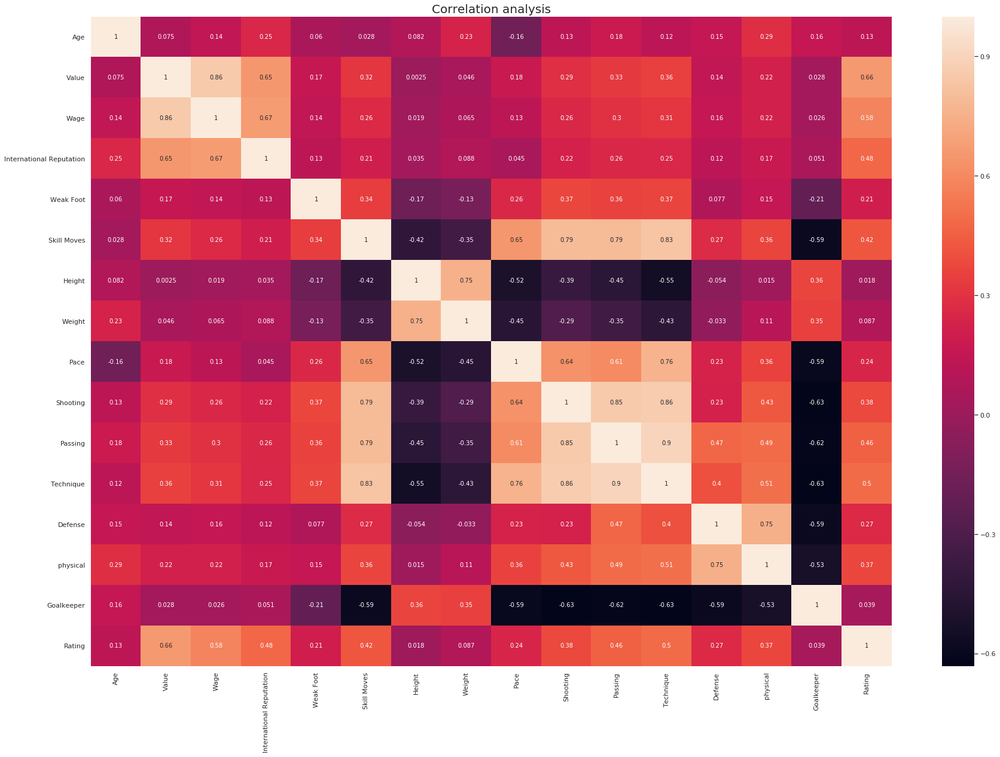

In [33]:
%matplotlib inline
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(),annot=True)
plt.title('Correlation analysis',fontsize=20)
plt.show()
plt.close()

### Analysis Through Data Visualization

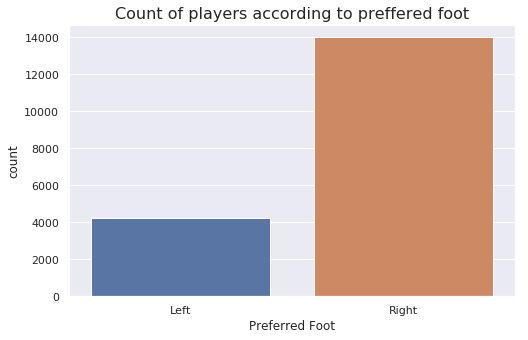

In [31]:
#plot b/w preffered foot and count
%matplotlib inline
plt.figure(figsize=(8,5))
sns.countplot(x='Preferred Foot',data=df)
plt.title('Count of players according to preffered foot',fontsize=16)
plt.show()
plt.close()

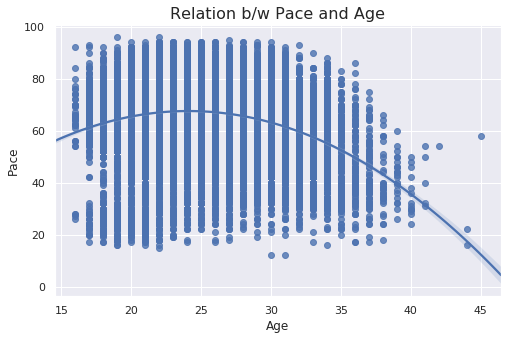

In [32]:
#Age vs Rating plot
%matplotlib inline
plt.figure(figsize=(8,5))
sns.regplot(x='Age',y='Pace',data=df,order=2)
plt.title('Relation b/w Pace and Age',fontsize=16)
plt.show()
plt.close()

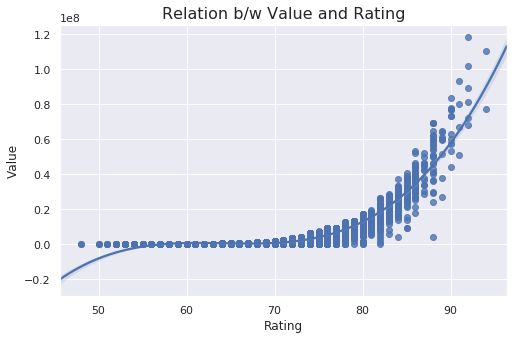

In [33]:
#Relation between value and Rating
%matplotlib inline
plt.figure(figsize=(8,5))
sns.regplot(x='Rating',y='Value',data=df,order=3)
plt.title('Relation b/w Value and Rating',fontsize=16)
plt.show()
plt.close()

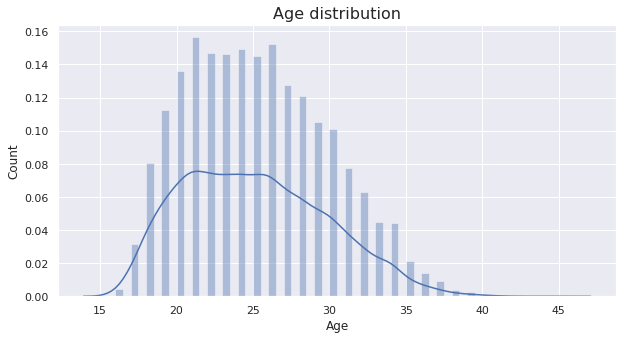

In [34]:
#Distribution of Age in data
%matplotlib inline
plt.figure(figsize=(10,5))
x = df['Age']
sns.distplot(x,bins=58)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age distribution',fontsize=16)
plt.show()
plt.close()

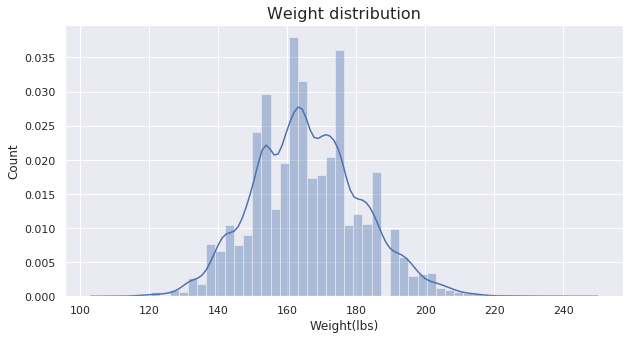

In [35]:
#Weight Distribution
%matplotlib inline
plt.figure(figsize=(10,5))
x = df['Weight']
sns.distplot(x)
plt.xlabel('Weight(lbs)')
plt.ylabel('Count')
plt.title('Weight distribution',fontsize=16)
plt.show()
plt.close()

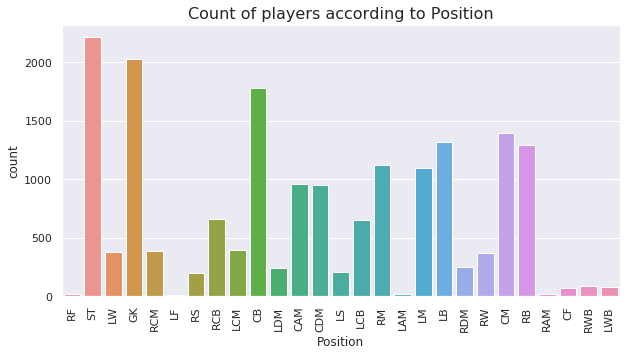

In [36]:
#Postioning distribution
%matplotlib inline
plt.figure(figsize=(10,5))
sns.countplot(x='Position',data=df)
plt.title('Count of players according to Position',fontsize=16)
plt.xticks(rotation=90)
plt.show()
plt.close()

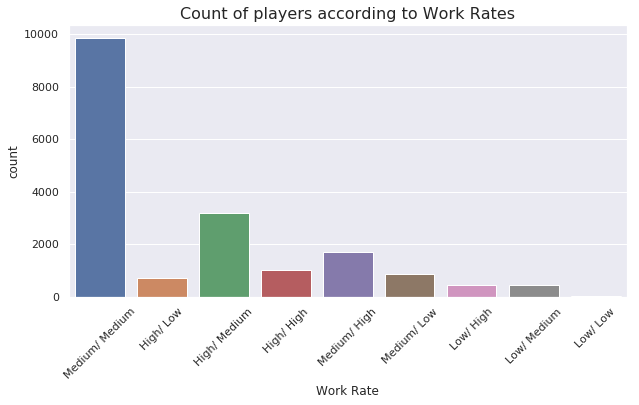

In [37]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.countplot(x='Work Rate',data=df)
plt.title('Count of players according to Work Rates',fontsize=16)
plt.xticks(rotation=45)
plt.show()
plt.close()

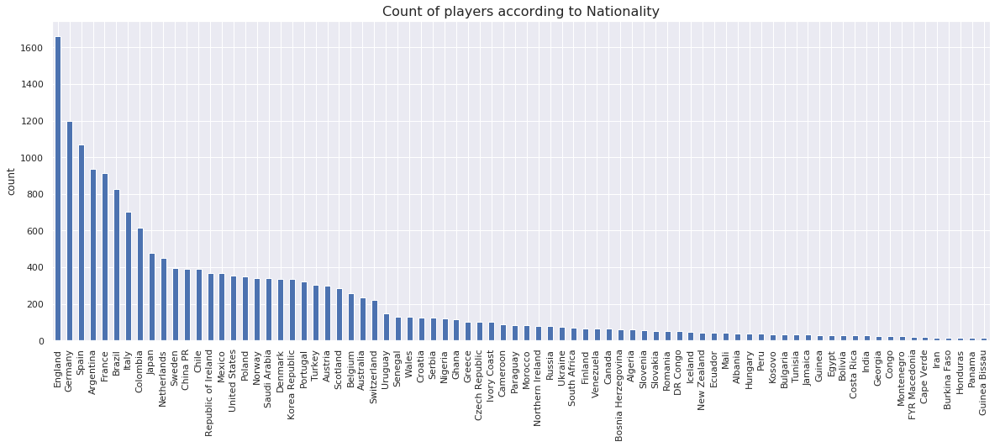

In [38]:
#Distribution according to nationality
%matplotlib inline
plt.figure(1,figsize=(20,7))
df['Nationality'].value_counts().head(80).plot(kind='bar')
plt.title('Count of players according to Nationality',fontsize=16)
plt.xticks(rotation=90)
plt.ylabel('count')
plt.show()
plt.close()

In [39]:
#distribution of features in some important clubs
imp_clubs = ['CD Leganés', 'Southampton', 'RC Celta', 'Empoli', 'Fortuna Düsseldorf', 'Manchestar City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid']

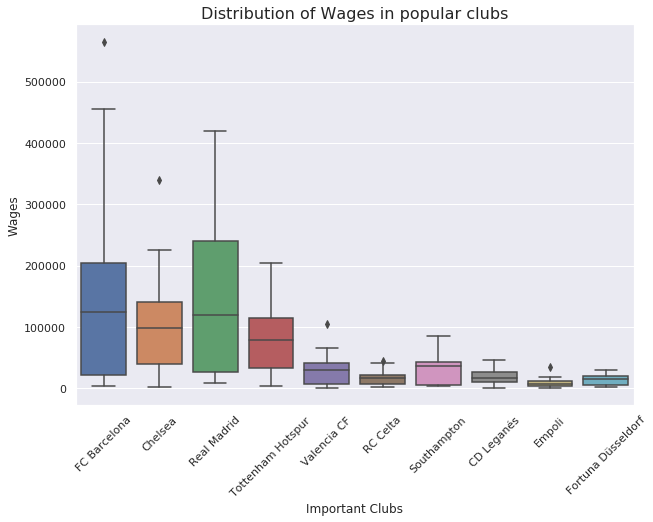

In [40]:
#Wage vs clubs
club = df.loc[df['Club'].isin(imp_clubs) & df['Wage']]
%matplotlib inline
plt.figure(figsize=(10,7))
sns.boxplot(x='Club',y='Wage',data=club)
plt.xlabel('Important Clubs')
plt.xticks(rotation=45)
plt.ylabel('Wages')
plt.title('Distribution of Wages in popular clubs',fontsize=16)
plt.show()
plt.close()

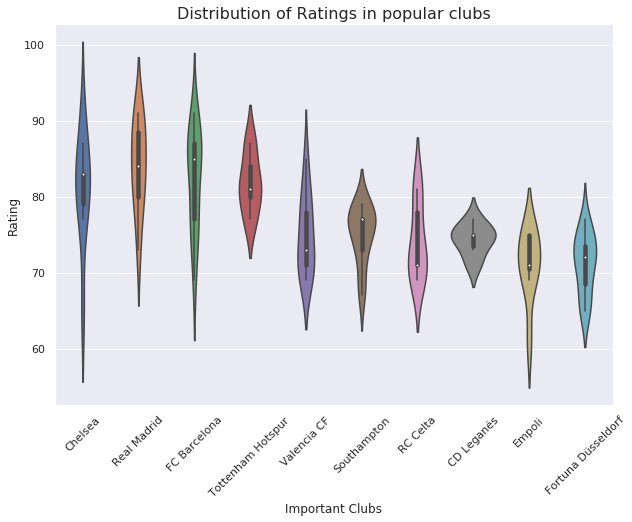

In [41]:
#Rating vs Clubs
club = df.loc[df['Club'].isin(imp_clubs) & df['Rating']]
%matplotlib inline
plt.figure(figsize=(10,7))
sns.violinplot(x='Club',y='Rating',data=club)
plt.xlabel('Important Clubs')
plt.xticks(rotation=45)
plt.ylabel('Rating')
plt.title('Distribution of Ratings in popular clubs',fontsize=16)
plt.show()
plt.close()

#### Map of Rating distribution 

In [117]:
#downloading geodata
!wget --quiet https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DV0101EN/labs/Data_Files/world_countries.json -O world_countries.json

print('file downloaded')

file downloaded


In [118]:
world_geo = r'world_countries.json'
m = folium.Map(location=[0, 0], zoom_start=2, tiles='Mapbox Bright')

In [119]:
#distribution of Rating and Nationality
rate = df[['Nationality','Rating']]
rate = rate.groupby('Nationality')['Rating'].mean().reset_index()

m.choropleth(
    geo_data=world_geo,
    data=rate,
    columns=['Nationality', 'Rating'],
    key_on='feature.properties.name',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Avg. Rating of players'
)
m

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


#### Pairwise plotting important features

<Figure size 1440x1440 with 0 Axes>

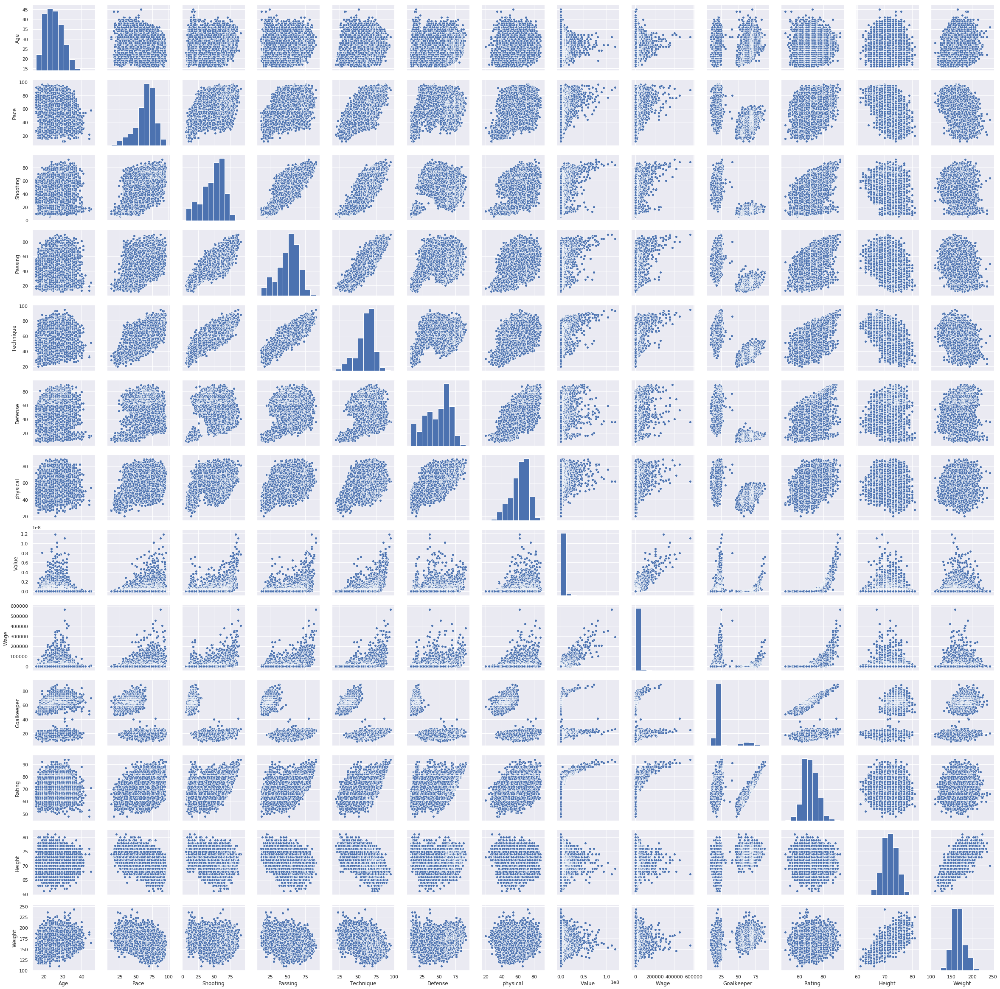

In [45]:
#Pairwise Plot of important Features
features = ['Age','Pace', 'Shooting', 'Passing', 'Technique', 'Defense', 'physical','Value', 
            'Work Rate', 'Wage', 'Preferred Foot', 'Goalkeeper', 'Rating',
            'Body Type', 'Position', 'Height', 'Weight']
plt.figure(figsize=(20,20))
sns.pairplot(df[features])
plt.show()
plt.close()

#### Radar plot for top rated players

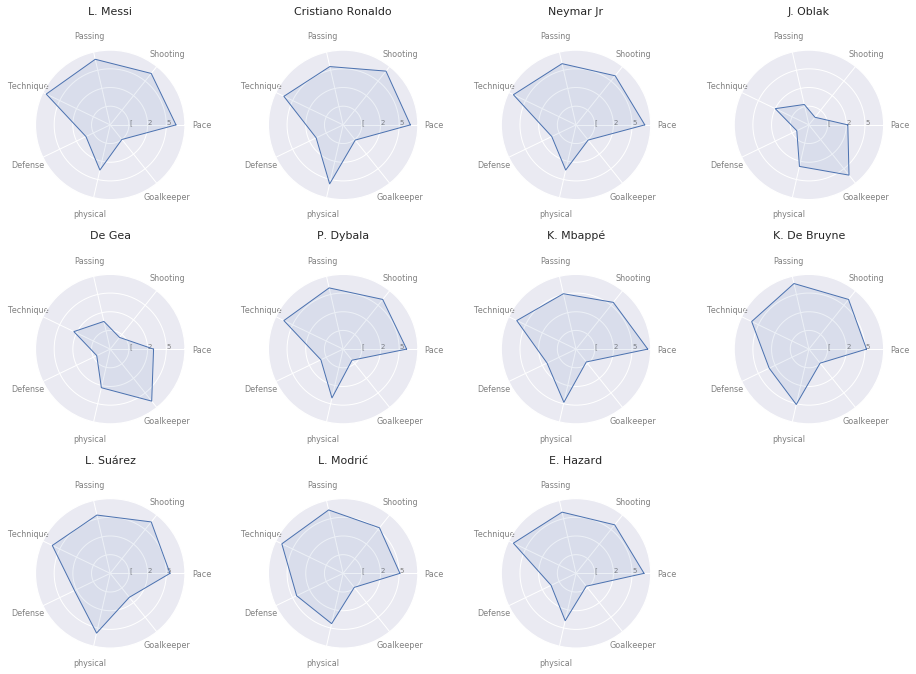

In [46]:
#Web plot of top 11 players according to rating
from math import pi
idx = 1

plt.figure(figsize=(16,44))
value = ['Name','Pace', 'Shooting', 'Passing', 'Technique', 'Defense', 'physical','Goalkeeper','Rating']
dataplot = df[value].sort_values(by='Rating',ascending=False).head(11).reset_index()
dataplot.drop(['index','Rating'],axis=1,inplace=True)

categ = list(dataplot)[1:]
N = len(categ)

for i in range(11):

    data = dataplot.loc[i].drop('Name').values.flatten().tolist()
    data += data[:1]

    angles = [n/float(N)*2*pi for n in range(N)]
    angles += angles[:1]

    ax = plt.subplot(11,4,idx,polar=True)

    plt.xticks(angles[:-1],categ,color='grey',size=8)

    ax.set_rlabel_position(0)
    plt.yticks([25,50,75],'[25,50,75]',color='grey',size=7)
    plt.ylim(0,100)

    plt.subplots_adjust(hspace=0.5)

    ax.plot(angles,data,linewidth=1,linestyle='solid')

    ax.fill(angles,data,'b',alpha=0.1)

    plt.title(dataplot.loc[i,'Name'],size=11,y=1.2)

    idx += 1

## Data Modelling

### Data Preparation

#### Forming the dataset

In [23]:
df_model = df.drop(['Name','Body Type','Nationality','Club','Preferred Foot','Work Rate','Position'],axis=1)
df_model.columns

Index(['Age', 'Value', 'Wage', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Height', 'Weight', 'Pace', 'Shooting', 'Passing',
       'Technique', 'Defense', 'physical', 'Goalkeeper', 'Rating'],
      dtype='object')

#### Forming the target variable

In [24]:
X = df_model.drop('Value',axis=1)
y = df_model['Value']

### Feature Selection

#### Showing the dependency of features on target 

In [44]:
feature_selection.mutual_info_regression(X,y)

array([0.28532847, 0.62548574, 0.11936243, 0.02237305, 0.19515862,
       0.        , 0.0204048 , 0.09063317, 0.26078949, 0.26661523,
       0.36280045, 0.28211911, 0.14260212, 0.34491944, 1.45729278])

### Splitting Data for Test Set

In [25]:
x_train, x_test, y_train, y_test = train_test_split(X,y,random_state=200)
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(13655, 15) (13655,) (4552, 15) (4552,)


### Scaling the data

In [27]:
scaler = StandardScaler().fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

### Applying Regression Models For Market Value Prediction of Players

#### Linear Regression

In [78]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [79]:
y_pred1 = lr.predict(x_test)
print('R2 score for train is ',lr.score(x_train,y_train))
print('R2 Score for test is ',lr.score(x_test,y_test))

R2 score for train is  0.7940369837292242
R2 Score for test is  0.7780397442583873


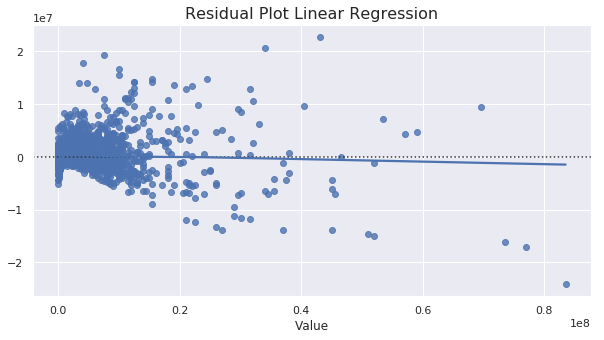

In [80]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.residplot(y_test,y_pred1,lowess=True)
plt.title('Residual Plot Linear Regression',fontsize=16)
plt.show()
plt.close()

#### Lasso Regression

In [74]:
from sklearn.linear_model import Lasso
ls = Lasso(max_iter=1000,alpha=2600)
poly = PolynomialFeatures(degree=2).fit(x_train)
x_poly = poly.transform(x_train)
ls.fit(x_poly,y_train)

Lasso(alpha=2600, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [75]:
x_test_poly = poly.transform(x_test)
y_pred2 = ls.predict(x_test_poly)
print('R2 score for train is',ls.score(x_poly,y_train))
print('R2 score for test is ',ls.score(x_test_poly,y_test))

R2 score for train is 0.954285766174833
R2 score for test is  0.9459846347926768


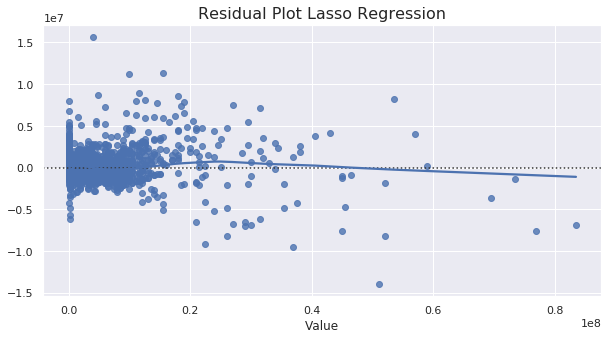

In [77]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.residplot(y_test,y_pred2,lowess=True)
plt.title('Residual Plot Lasso Regression',fontsize=16)
plt.show()
plt.close()

#### Ridge Regression

In [99]:
from sklearn.linear_model import Ridge
poly = PolynomialFeatures(degree=2).fit(x_train)
x_poly = poly.transform(x_train)
rr = Ridge(max_iter=200,alpha=0.00001)
rr.fit(x_poly,y_train)

Ridge(alpha=1e-05, copy_X=True, fit_intercept=True, max_iter=200,
   normalize=False, random_state=None, solver='auto', tol=0.001)

In [100]:
x_test_poly = poly.transform(x_test)
y_pred3 = rr.predict(x_test_poly)
print('R2 score for train is ',rr.score(x_poly,y_train))
print('R2 score for test is ',rr.score(x_test_poly,y_test))

R2 score for train is  0.954595627128578
R2 score for test is  0.945665453360139


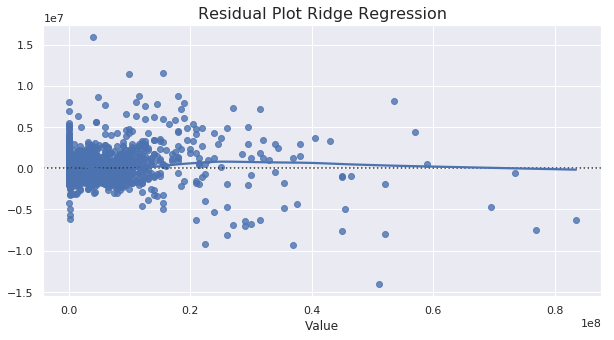

In [101]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.residplot(y_test,y_pred3,lowess=True)
plt.title('Residual Plot Ridge Regression',fontsize=16)
plt.show()
plt.close()

#### RandomForest Regressor

In [116]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100,max_depth=15)
rf.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=15,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [117]:
y_pred4 = rf.predict(x_test)
print('R2 score for train is ',rf.score(x_train,y_train))
print('R2 score for test is ',rf.score(x_test,y_test))

R2 score for train is  0.996170970485265
R2 score for test is  0.9738198134635021


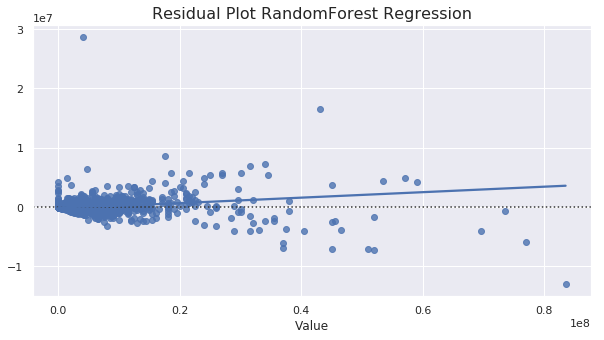

In [118]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.residplot(y_test,y_pred4,lowess=True)
plt.title('Residual Plot RandomForest Regression',fontsize=16)
plt.show()
plt.close()

#### ElasticNet Regressor

In [129]:
from sklearn.linear_model import ElasticNet
en = ElasticNet(max_iter=8000,alpha=0.0001)
poly = PolynomialFeatures(degree=2).fit(x_train)
x_poly = poly.transform(x_train)
en.fit(x_poly,y_train)

ElasticNet(alpha=0.0001, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=8000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [130]:
x_test_poly = poly.transform(x_test)
y_pred5 = en.predict(x_test_poly)
print('R2 score for train is ',en.score(x_poly,y_train))
print('R2 score test is ',en.score(x_test_poly,y_test))

R2 score for train is  0.9545955794297403
R2 score test is  0.9456631010008901


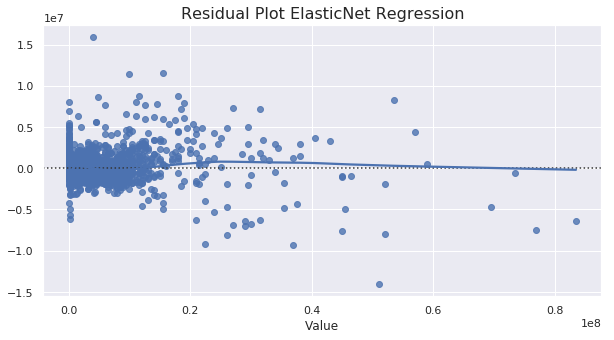

In [131]:
%matplotlib inline
plt.figure(figsize=(10,5))
sns.residplot(y_test,y_pred5,lowess=True)
plt.title('Residual Plot ElasticNet Regression',fontsize=16)
plt.show()
plt.close()

### Applying Classification Models For Predicting the Player's Position on Field 

#### Data Preparation

In [132]:
df_class = df.drop(['Name','Nationality','Club','Body Type','Value','Wage','Work Rate'],axis=1)

In [133]:
df_class['Preferred Foot'] = np.where(df_class['Preferred Foot']=='Right',1,0)

In [134]:
forward = ['ST','LS','CF','RS','RW','LW','RF','LF'] 
midfielder = ['LAM','CAM','RAM','LM','RM','LCM','RCM','CM','LDM','CDM','RDM'] 
defense = ['LWB','RWB','LB','RB','LCB','RCB','CB']

In [135]:
def convert(x):
    if x in forward:
        x = 3
    elif x in midfielder:
        x = 2
    elif x in defense:
        x = 1
    else:
        x = 0
    return x

In [136]:
df_class['Position'] = df_class['Position'].apply(lambda x : convert(x))

#### Target Variable Formation

The target varable is formed such that if a player's position is attacking then its value is 3, for midfielders value is 2, for defenders the value is 1 and for goalkeeper the value is 0. Using this we will classify a player's playing zone according to his feature attributes like shooting, technique, age, etc.

In [137]:
X_class = df_class.drop('Position',axis=1)
y_class = df_class['Position']

#### Splitting for test set

In [138]:
x_train, x_test, y_train, y_test = train_test_split(X_class, y_class, random_state=5)
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(13655, 15) (13655,) (4552, 15) (4552,)


#### Scaling the data

In [139]:
scaler = StandardScaler().fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  from ipykernel import kernelapp as app
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  app.launch_new_instance()


In [140]:
import warnings
warnings.filterwarnings('ignore', 'Solver terminated early.*')

#### Logistic Regression

In [158]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(max_iter=100000,solver='saga',multi_class='ovr')
grid = {'C':[1,5,10,20]}
grid_clf = GridSearchCV(clf,param_grid=grid,scoring='accuracy',cv=5)
grid_clf.fit(x_train,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100000, multi_class='ovr',
          n_jobs=None, penalty='l2', random_state=None, solver='saga',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [1, 5, 10, 20]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [159]:
print(grid_clf.best_score_, grid_clf.best_params_)

0.8387403881362139 {'C': 10}


In [160]:
pred1 = grid_clf.predict(x_test)
print('Accuracy = ',grid_clf.score(x_test,y_test))

Accuracy =  0.835676625659051


In [161]:
print(metrics.classification_report(y_test,pred1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       499
           1       0.87      0.88      0.87      1471
           2       0.77      0.79      0.78      1706
           3       0.81      0.75      0.78       876

   micro avg       0.84      0.84      0.84      4552
   macro avg       0.86      0.86      0.86      4552
weighted avg       0.84      0.84      0.84      4552



#### K-Nearest Neighbour Classifier

In [196]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier()
grid = {'n_neighbors':[8,9,10,11,12,13,14,15]}
grid_clf = GridSearchCV(clf,param_grid=grid,scoring='accuracy',cv=5)
grid_clf.fit(x_train,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_neighbors': [8, 9, 10, 11, 12, 13, 14, 15]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [197]:
print(grid_clf.best_score_, grid_clf.best_params_)

0.8176492127425852 {'n_neighbors': 13}


In [198]:
pred2 = grid_clf.predict(x_test)
print('Accuracy = ',grid_clf.score(x_test,y_test))

Accuracy =  0.8178822495606327


In [201]:
print(metrics.classification_report(y_test,pred2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       519
           1       0.84      0.87      0.85      1397
           2       0.75      0.80      0.77      1731
           3       0.83      0.68      0.75       905

   micro avg       0.82      0.82      0.82      4552
   macro avg       0.85      0.84      0.84      4552
weighted avg       0.82      0.82      0.82      4552



#### Random Forest Classifier

In [232]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=200)
grid = {'n_estimators':[100,150,200,250],'max_depth':[30,35,40,45,50]}
grid_clf = GridSearchCV(clf,param_grid=grid,scoring='accuracy',cv=5)
grid_clf.fit(x_train,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [100, 150, 200, 250], 'max_depth': [30, 35, 40, 45, 50]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [233]:
print(grid_clf.best_score_, grid_clf.best_params_)

0.853972903698279 {'max_depth': 30, 'n_estimators': 250}


In [234]:
pred3 = grid_clf.predict(x_test)
print('Accuracy = ',grid_clf.score(x_test,y_test))

Accuracy =  0.8488576449912126


In [235]:
print(metrics.classification_report(y_test,pred3))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       519
           1       0.87      0.88      0.88      1397
           2       0.79      0.83      0.81      1731
           3       0.86      0.74      0.79       905

   micro avg       0.85      0.85      0.85      4552
   macro avg       0.88      0.86      0.87      4552
weighted avg       0.85      0.85      0.85      4552



#### SVC Classifier

In [167]:
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC

In [168]:
y_train = label_binarize(y_train,classes=[0,1,2,3])
y_test = label_binarize(y_test,classes=[0,1,2,3])
n_class = 4

In [169]:
clf = OneVsRestClassifier(SVC())
y_score = clf.fit(x_train, y_train).decision_function(x_test)

In [170]:
pred4 = clf.predict(x_test)
print('Accuracy = ',clf.score(x_test,y_test))

Accuracy =  0.8361159929701231


In [173]:
print(metrics.classification_report(y_test,pred4))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       499
           1       0.88      0.90      0.89      1471
           2       0.78      0.85      0.81      1706
           3       0.87      0.73      0.79       876

   micro avg       0.85      0.86      0.85      4552
   macro avg       0.88      0.87      0.87      4552
weighted avg       0.86      0.86      0.85      4552
 samples avg       0.85      0.86      0.85      4552



/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels.
  'precision', 'predicted', average, warn_for)


In [241]:
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_class):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

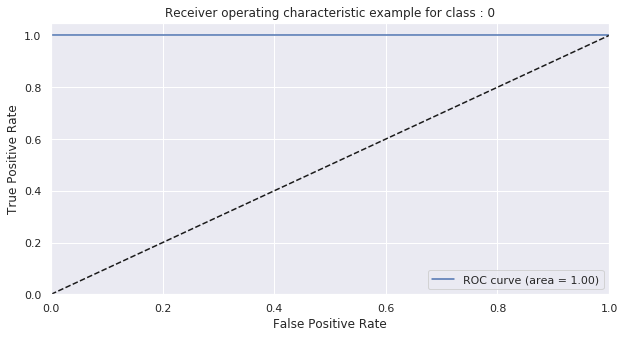

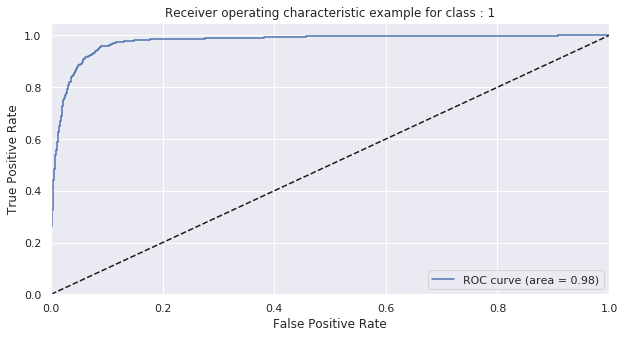

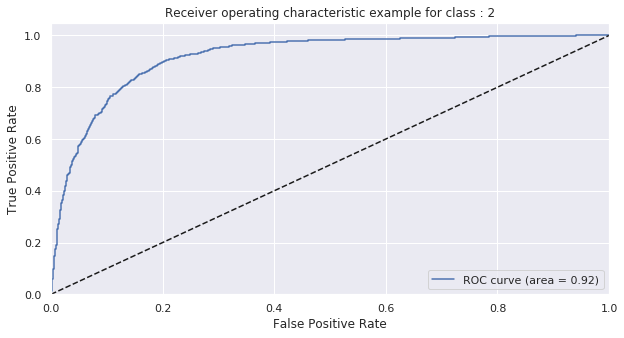

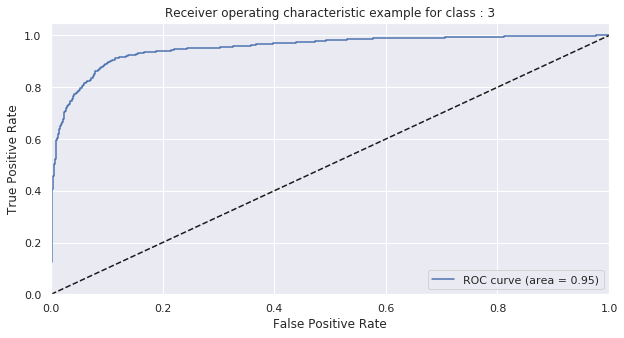

In [245]:
for i in range(n_class):
    plt.figure(figsize=(10,5))
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example for class : '+str(i))
    plt.legend(loc="lower right")
    plt.show()

## Regression Report

<!DOCTYPE html>
<html>
<head>
<style>
table, th, td {
  border: 1px solid black;
}
</style>
</head>
<body>  
    
<table>
    <tr>
        <th>Regression Model</th>
        <th>R2 Score</th>
    </tr>
    <tr>
        <td>Linear Regression</td>
        <td>0.7785093018154635</td>
    </tr>
    <tr>
        <td>ElasticNet Regression</td>
        <td>0.9088358449871332</td>
    </tr>
    <tr>
        <td>Lasso Regression</td>
        <td>0.9456615685608045</td>
    </tr>
    <tr>
        <td>Ridge Regression</td>
        <td>0.94566511715391</td>
    </tr>
    <tr>
        <td>RandomForest Regressor</td>
        <td>0.9733169136598047</td>
    </tr>
</table>
</body>
</html>

## Classification Report

<!DOCTYPE html>
<html>
<head>
<style>
table, th, td {
  border: 1px solid black;
}
</style>
</head>
<body>  
    
<table>
    <tr>
        <th>Classification Model</th>
        <th>Accuracy</th>
        <th>Precision(macro_avg)</th>
        <th>Recall(macro_avg)</th>
        <th>F1 Score(macro_avg)</th>
    </tr>
    <tr>
        <td>Logistic Regression</td>
        <td>0.843365553602812</td>
        <td>0.87</td>
        <td>0.86</td>
        <td>0.87</td>
    </tr>
    <tr>
        <td>KNN Classifier</td>
        <td>0.8178822495606327</td>
        <td>0.85</td>
        <td>0.84</td>
        <td>0.84</td>
    </tr>
    <tr>
        <td>RandomForest Classifier</td>
        <td>0.8488576449912126</td>
        <td>0.88</td>
        <td>0.86</td>
        <td>0.87</td>
    </tr>
    <tr>
        <td>SVC Classifier</td>
        <td>0.8299648506151143</td>
        <td>0.88</td>
        <td>0.86</td>
        <td>0.87</td>
    </tr>
</table>
</body>
</html>